## AIC Calcium data analysis

1. Adjust the Settings in the cell below.<br><br>
2. Run the whole script by pressing *Run* above. Or run cell-by-cell by pressing CTRL+ENTER.
<br>Starting the script will open a file dialog (possibly hidden behind other windows). Select the Labview .lvm file to analyze.
(Only tested for "CalciumRecordings2channels.vi", 2 signal channels + stimulation channel.)<br><br>
3. Check for error messages below each cell, and make necessary changes.
   <br><br> Typical data issues:
   - Problem: detected stimulus frequency/block lenght/ ON/OFF time is wrong.
       -  Cause: Beginning or end of recording contains incomplete stim block that messes up the regular paradigm. 
           -  Solution: Set *CutStart* or *CutEnd* accordingly to remove any incomplete stim. blocks.
 -  Problem: Detected modulation frequency is wrong (e.g. both channels show 980Hz)
     -   Cause: There was too much laser crosstalk.
         -  Solution: Manually set a value for *mod_ch1* or *mod_ch2*.
  -  Problem: Not all or too many signal drops / jumps are detected.
      -  Cause: Unusually high/low noise in the signal. 
          -  Solution: adjust the advanced parameters *xSTD*, i.e. how many standard deviations are considered to be a jump. and *timetoconsider* i.e. how many seconds before and after each time point should be compared. *Tip*: The output of the cell *Fixing jumps in data* shows the time in seconds where each jump is detected. Compare by eye whether these time points make sense. Also it may need a lot of trial and error, better go directly to the *Fixing jumps* cell below, and play around with different values and re-run only that cell.
  -  Problem: Detrending is overfitting the time course or not removing enough baseline oscillations.
      -  Cause: For long stimulation blocks or lots of physiological noise the automaticpolynomial degree may be wrong.
          -  Solution: Go to the *Detrending / Baseline drift removal* cell, check the output *polynomial degree x. Locate the line #pnum=n in the code above, uncomment the line and enter a value larger or smaller than in the output (must be some integer value).
<br><br>
4. To to clear all previous values and prevent errors, run whole script again after changing a parameter (Button with two arrows above, confirm when asked to restart Kernel)
<br><br>
5. Outputs (created in the same folder as the .lvm file):
    -  A .mat file with the same filename as the .lvm file selected. See Matlab cell below for description of its contents. 
    -  Plots are not stored. Manually format them using plotly and store as image.
    -  Two text files, *regressor1_married.1D* and *regressor2_married.1D* are created. Can be used as inputs for AFNI 3DDeconvolve. (Currently fixed at 1s resolution, like usual fMRI TR, and starting from (first stimulus event - *bsl*) selected in the Settings)


Limitations: <br>
- Although it should work for any modulation frequency, the filter settings have only been tested for 1230Hz (channel1) and 980Hz (channel2).<br>
- The automatic stimulus detection and block averaging only works for regular block stimulation, i.e. constant stim.freq., block duration, and inter-stimulus interval during the whole scan.
- Currently its not possible to cut out time periods in the middle of the time course (only start or end), but bad blocks can be removed from the average.


>©2018 AIC 



## Settings

In [1]:
# In case of artifacts, cut off from start or end (in s):
CutStart = 0
CutEnd = 0

# Time resolution after downsampling in s:
tres_new = 0.01

# Plot size
plotsize = (15,10)  # typically 10 to 15 is ok.


#-- Settings for average response plots:

baseline = 10 # baseline to consider before each block, 10
_time = 30 # how many seconds to display after stim block ends, 30
# discardN = (0,1,2)  # Which block to ignore from average (index starts at 0)


#-- AFNI regressors
bsl = 110   # seconds to include before first stimulus event

#-- Create output files?
create_output = True  # True or False


#-- Advanced Settings
# mod_ch1 = 1230  # <-- Enter the mod. freq. manually if automatic detection fails.
# mod_ch2 = 980

xSTD = 5  # How many standard deviations to consider a signal "jump/drop" in the data?
secstoconsider = 2 # How many seconds before and after a signal jump should be compared?


## Import libraries

To install missing libraries that are not included in python by default: type *pip install [libraryname]* in the terminal
- plotly (for nicer plots)
- lvm_read  (to read LabView .lvm files)
- peakutils (to detect peaks in time series, here used to find stimulus events)

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import lvm_read
import pandas as pd
import plotly as py
import plotly.graph_objs as go
import calciumHelperfunctions
# from calciumHelperfunctions import openfiledialogue, detect_stim_paradigm, FFT_calculate_plot
import calciumHelperfunctions as h
from imp import importlib
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import pylab

plt.style.use('seaborn-white')
%matplotlib inline

py.offline.init_notebook_mode(connected=True)

In [3]:
importlib.reload(calciumHelperfunctions)
import calciumHelperfunctions as h

## Importing Labview recordings

In [4]:
file_path = h.openfiledialogue('.lvm')
data_path = os.path.dirname(file_path)

# to manually select a file:
# file_path='/Volumes/Zhivaz/Ca_data/mouse/20180115/6439_075mA1HzRHP.lvm'

lvm_file = lvm_read.read(file_path)
channel_names = lvm_file[0]['Channel names'] 

# make sure correct channels selected below
chan1=1
chan2=3

N = lvm_file[0]['data'].shape[0]  # total number of data points
fs = int(np.around(1 / lvm_file[0]['Delta_X'][0],decimals=2))
time_sec = np.arange(1/fs,N/fs+1/fs,1/fs)

index = pd.Index(time_sec, name=['originalTime'])
columns = pd.MultiIndex.from_product([['channel1','channel2'],['raw','sin_ref','cos_ref','demod_sin','demod_cos','demod_sin_filtered','demod_cos_filtered','demod_tot']],names=['channel','step'])

# create empty DataFrame
calcium = pd.DataFrame(np.zeros((index.size,columns.size)),index = index, columns = columns)

# Fill in some columns
calcium['channel1','raw'] = -lvm_file[0]['data'][:,chan1]  # check above channel_names list if correct column is chosen here
calcium['channel2','raw'] = -lvm_file[0]['data'][:,chan2]  # minus because AIC amplifier doesnt produces negative voltage signal.
calcium = calcium.sort_index()

calcium = calcium.iloc[int(CutStart*fs):int(len(calcium)-CutEnd*fs),:]
stimchannel = lvm_file[0]['data'][int(CutStart*fs):int(len(lvm_file[0]['data'])-CutEnd*fs),5]

#used later to store .mat file, regressors, and plots
matfilename=os.path.splitext(os.path.basename(file_path))[0]
storagepath=os.path.join(os.path.abspath(data_path),matfilename)
if not os.path.exists(storagepath):
    os.makedirs(storagepath)


print ('loaded ' + file_path)
print ('sampling rate is : ' + str(fs))

loaded D:/data/2015/6938_E6.lvm
sampling rate is : 20000


## Basic Preprocessing

stim freq: 4.0Hz
ON period: 8.0s
OFF period: 82.0s
Signals slower than 180.0s will be removed (later)

channel 1 is rcamp with mod. freq.: 1230.0 Hz
channel 2 is gcamp with mod. freq.: 890.0 Hz


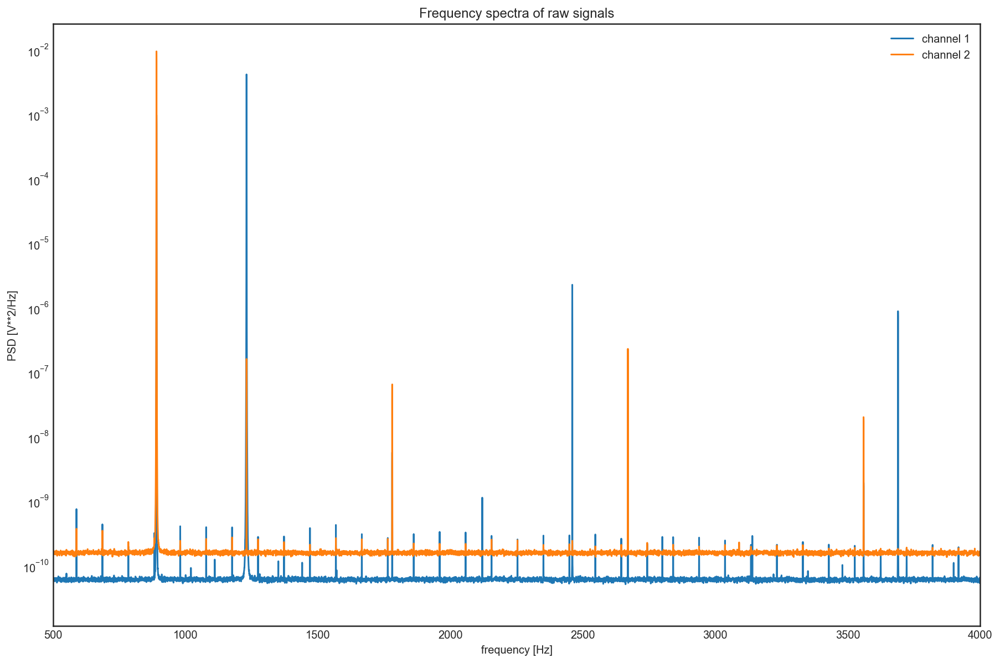

In [5]:
# get stimulus parameters  - check output below if correct, if not, set those variables manually
(n_pulses, n_blocks, stim_freq, pulses_block,
 block_duration, off_period, peakindexes_sec, peakindexes, period) = h.detect_stim_paradigm(stimchannel, fs)

# Show a power spectrum - check if signals show correct peaks
mod_ch1, mod_ch2 = h.FFT_calculate_plot(calcium, fs, plotsize)

# double check if this output is correct
print(f'\nchannel 1 is {channel_names[chan1]} with mod. freq.: {str(mod_ch1)} Hz')
print(f'channel 2 is {channel_names[chan2]} with mod. freq.: {str(mod_ch2)} Hz')


#--- apply Demodulation ---
calcium, peakindexes_sec = h.demodulate(calcium, mod_ch1, mod_ch2, fs, peakindexes_sec)


#--- Apply Downsampling ---
start = calcium.index[0]-CutStart
time_sec_ds = np.arange(start, h.downsamplebin(calcium['channel1','demod_tot'].values, tres_new, fs).size*tres_new+start-tres_new, tres_new)
_index = pd.Index(time_sec_ds, name=['downsampled time'])
columns = pd.MultiIndex.from_product([['channel1', 'channel2'],['downsampled_raw','baseline_fit','detrended']],names=['channel','step'])
calcium_ds = pd.DataFrame(np.zeros((_index.size, columns.size)), index=_index, columns = columns)
calcium_ds = calcium_ds.sort_index(axis=0)
calcium_ds = calcium_ds.sort_index(axis=1)
calcium_ds['channel1', 'downsampled_raw'] = h.downsamplebin(calcium['channel1','demod_tot'].values, tres_new, fs)[:calcium_ds.index.size]
calcium_ds['channel2', 'downsampled_raw'] = h.downsamplebin(calcium['channel2','demod_tot'].values, tres_new, fs)[:calcium_ds.index.size]

# for single pulse stimulation

n_pulses=30
n_blocks=n_pulses
stim_freq=1
pulses_block=1
block_duration=1
off_period=39

period=2*(off_period+block_duration)

## Fixing jumps in data
Some short spikes may remain in the data. This is no problem, it will be averaged out in the downsampling procedure in the next cell.

jump detected in Ch2 at 937.65s


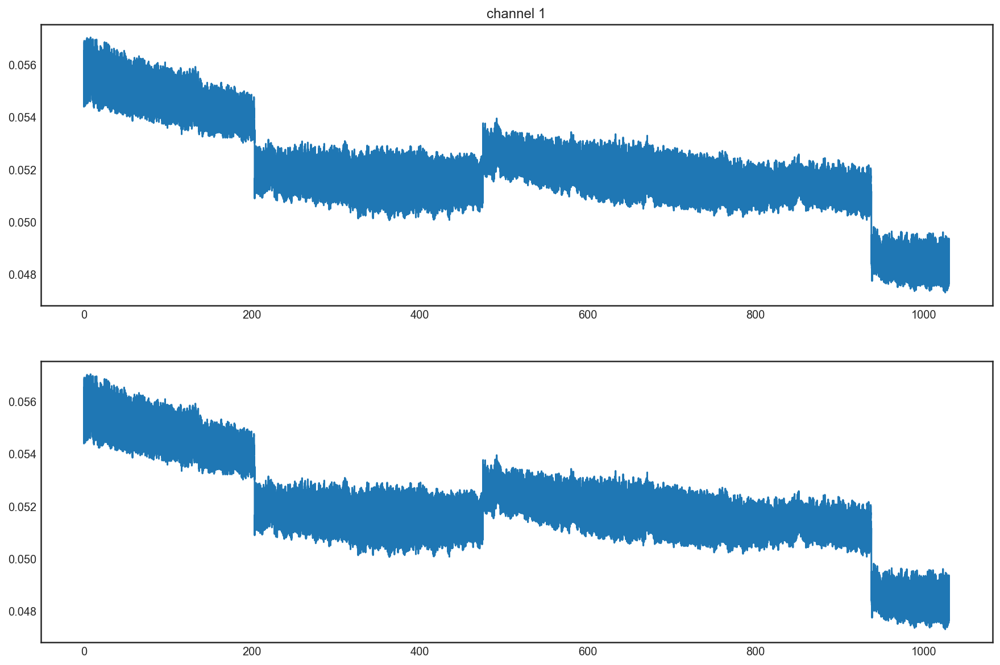

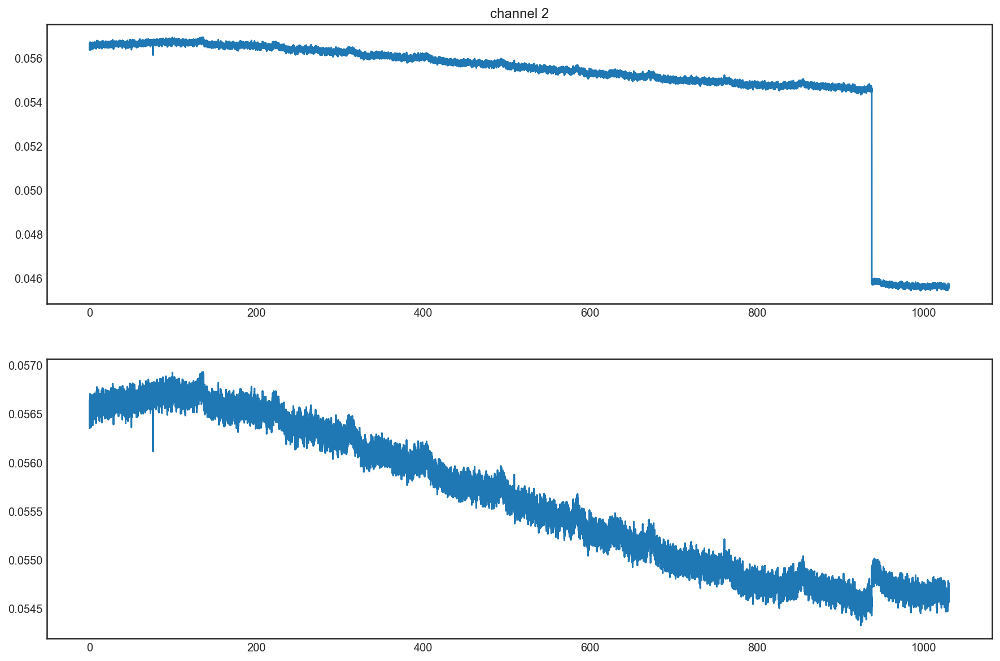

In [6]:
channel1_value = 6 #<--- How many SD does signal have to change one point to the next to be considered a "jump"
channel2_value = 6

calcium_ds['channel1','downsampled_fixed'] = h.fixjumps(calcium_ds['channel1', 'downsampled_raw'].values,calcium_ds.index.values, 'Ch1', fs=fs, tres_new=tres_new, xSTD=channel1_value)
calcium_ds['channel2','downsampled_fixed'] = h.fixjumps(calcium_ds['channel2', 'downsampled_raw'].values,calcium_ds.index.values, 'Ch2', fs=fs, tres_new=tres_new, xSTD=channel2_value)


plt.figure(figsize=plotsize)
plt.subplot(2, 1, 1)
plt.title('channel 1')
plt.plot(calcium_ds['channel1','downsampled_raw'])
plt.subplot(2, 1, 2)
plt.plot(calcium_ds['channel1','downsampled_fixed'])
pylab.savefig(os.path.join(storagepath,'jumps_ch1.svg'))


plt.figure(figsize=plotsize)
plt.subplot(2, 1, 1)
plt.title('channel 2')
plt.plot(calcium_ds['channel2','downsampled_raw'])
plt.subplot(2, 1, 2)
plt.plot(calcium_ds['channel2','downsampled_fixed'])
pylab.savefig(os.path.join(storagepath,'jumps_ch2.svg'))

## Detrending / Baseline drift removal

polynomial degree  6
Approximately high-pass filter with 258.0s period.


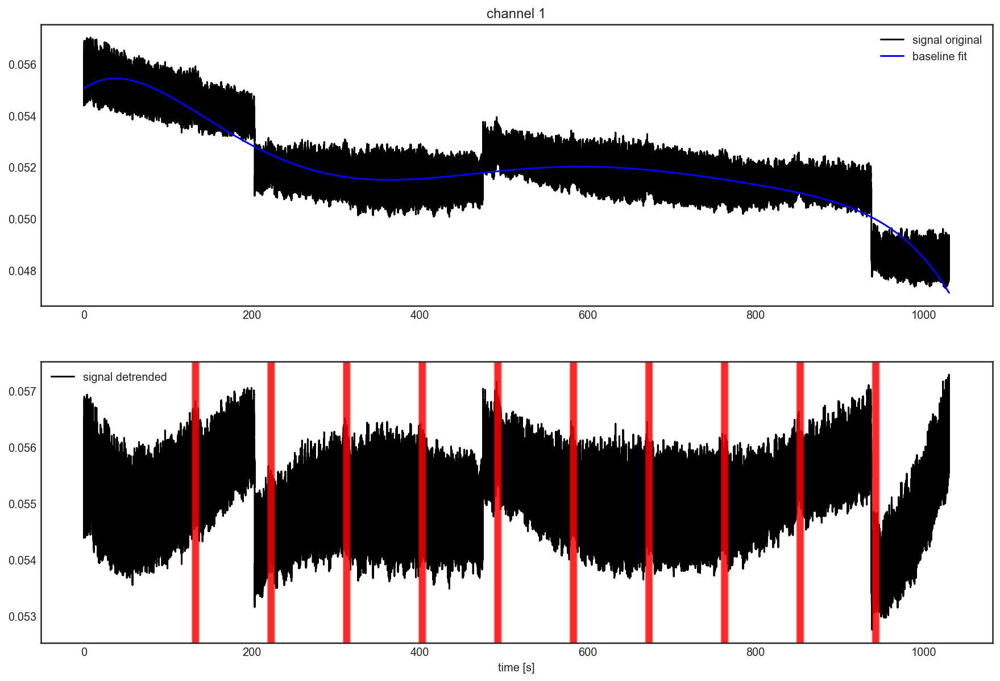

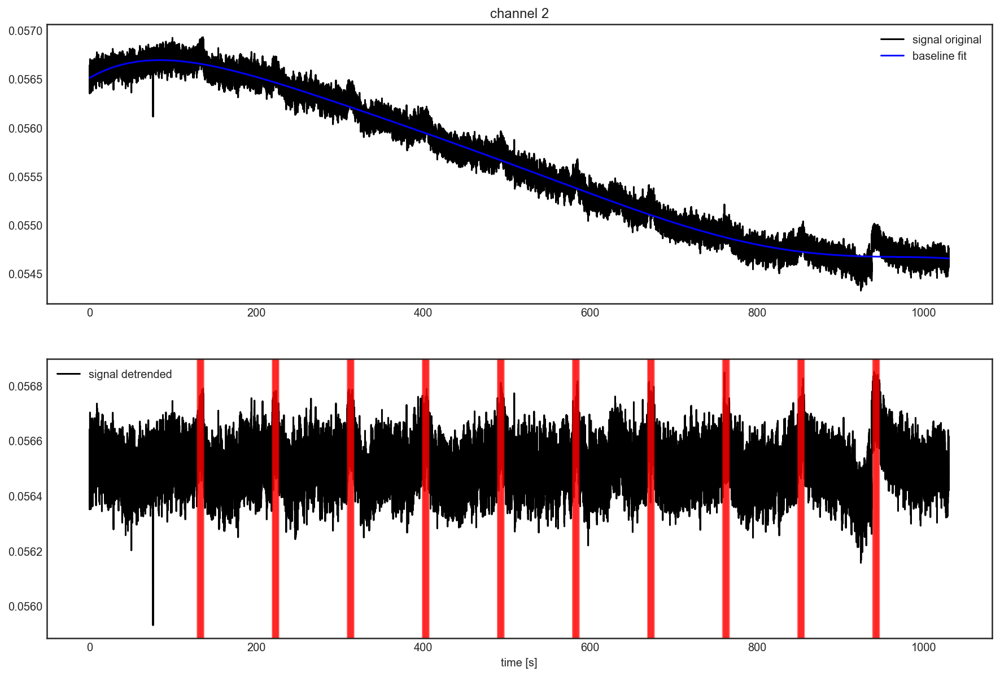

In [7]:
#find degree of polynomial (based on AFNI formula)
pnum = h.find_optimal_polynomial(calcium_ds, period)

# pnum=0 # <--  manually set polynomial degree here, or 0 to turn off detrending.

calcium_ds = h.calciumDetrend(calcium_ds, '1', pnum, plotsize, peakindexes_sec, storagepath)
calcium_ds = h.calciumDetrend(calcium_ds, '2', pnum, plotsize, peakindexes_sec, storagepath)

## Averaging stimulation blocks

In [8]:
blocks_perc_ch1 = h.average_and_plot('channel1', n_blocks, block_duration, stim_freq, calcium_ds, baseline, _time, tres_new, peakindexes_sec, storagepath)
blocks_perc_ch2 = h.average_and_plot('channel2', n_blocks, block_duration, stim_freq, calcium_ds, baseline, _time, tres_new, peakindexes_sec, storagepath)

## Storing Response in Matlab file

Not tested yet. Will create a new .mat file each time in the same folder as the .lvm file.
Filename is the same as the .lvm file. More infos under https://docs.scipy.org/doc/scipy/reference/tutorial/io.html

Contents of the file are arranged like this:<br>
<br>
-Channel 1
    -  mean (of all blocks, in percent signal)
    -  SD (standard deviation across blocks)
    -  time (x axis)
    -  stim (stim pulses in seconds)
-Channel 2 
    -  mean (of all blocks, in percent signal)
    -  SD (standard deviation across blocks)
    -  time (x axis)
    -  stim (stim pulses in seconds)

In [9]:
contentsCh1 = {'mean': blocks_perc_ch1['mean'].values, 'SD': blocks_perc_ch1['SD'].values, 'time': blocks_perc_ch1.index.values, 'stim':list(np.arange(0,block_duration,1/stim_freq)) }
contentsCh2 = {'mean': blocks_perc_ch2['mean'].values, 'SD': blocks_perc_ch2['SD'].values, 'time': blocks_perc_ch2.index.values, 'stim':list(np.arange(0,block_duration,1/stim_freq)) }

if create_output:    
    sio.savemat(os.path.join(storagepath,matfilename),{matfilename+ ' Channel 1':contentsCh1, matfilename+ ' Channel 2':contentsCh2})
    print(matfilename + '.mat successfully stored under ' + storagepath)


6938_E6.mat successfully stored under D:\data\2015\6938_E6


## Creating regressor files for AFNI

D:\data\2015\6938_E6\regressor1_married.1D created
D:\data\2015\6938_E6\regressor2_married.1D created


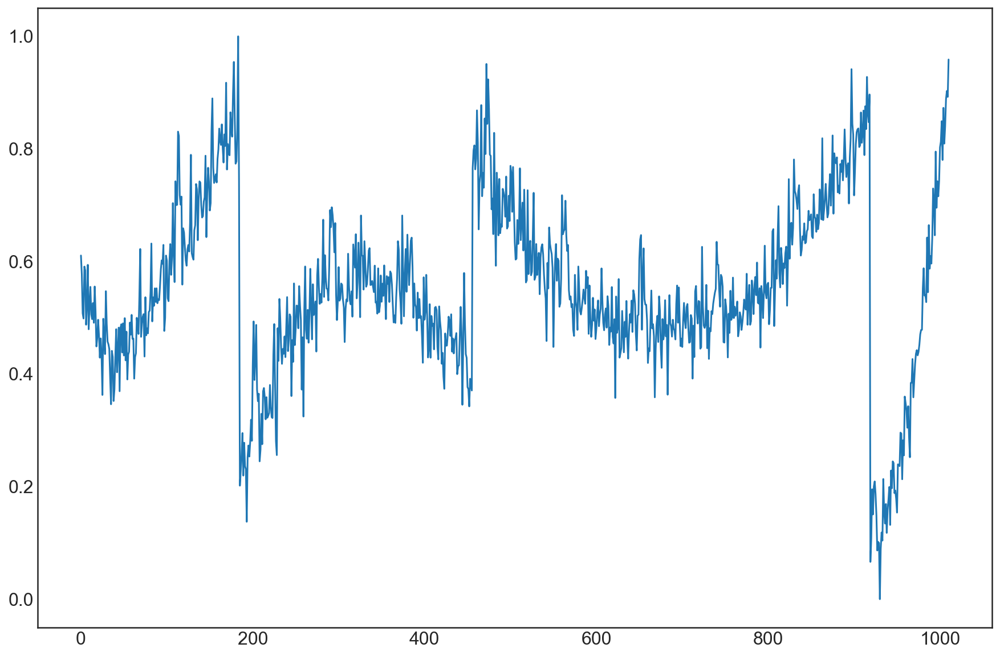

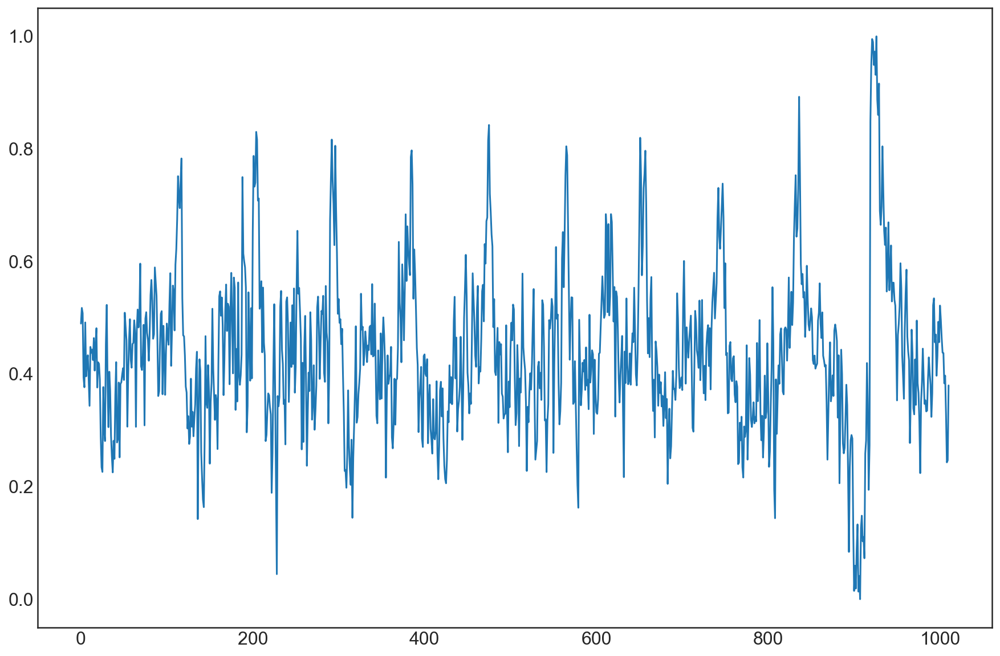

In [10]:
# cutting off calcium trace
idx = pd.IndexSlice

ch1cut = calcium_ds.loc[idx[peakindexes_sec[0]-bsl:],idx['channel1','detrended']].values
ch2cut = calcium_ds.loc[idx[peakindexes_sec[0]-bsl:],idx['channel2','detrended']].values

# Downsampling further to 1s TR
ch1ds = h.downsamplebin(ch1cut, timeresOUT=1, samplingrateIN=1/tres_new)
ch2ds = h.downsamplebin(ch2cut, timeresOUT=1, samplingrateIN=1/tres_new)
regtimes = np.array(range(ch1ds.size))

# scaling trace between 0 and 1
def scaleCa(x):
    x = x - np.min(x)
    x = x*(1/np.max(x))
    return x

ch1ds2 = scaleCa(ch1ds)
ch2ds2 = scaleCa(ch2ds)

plt.figure(figsize=plotsize)
plt.plot(ch1ds2)
pylab.savefig(os.path.join(storagepath,'regressor_ch1.svg'))

plt.figure(figsize=plotsize)
plt.plot(ch2ds2)
pylab.savefig(os.path.join(storagepath,'regressor_ch2.svg'))

# 3dmarry function
# input:  a=[1, 2] b=[2.4, 3.7]
# output should look like:  1*2.4 2*3.7
def Marry(time,amplitude,regressorN):
    outputs=[]
    for time, amplitude in zip(time,amplitude):
        output='{:d}'+'*'+'{:f} '
        formatted=output.format(time,amplitude)
        outputs.append(formatted)

    regressorfilename = os.path.join(os.path.abspath(storagepath), regressorN + '_married.1D')
    thefile = open(regressorfilename, 'w')
    for item in outputs:
      thefile.write("".join(item))
    print(str(regressorfilename),'created')

if create_output:    
    Marry(regtimes,ch1ds2,'regressor1')
    Marry(regtimes,ch2ds2,'regressor2')
